In [ ]:
%load_ext autoreload
%autoreload 2

# import libraries
import math
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import imageio

# set figure size
plt.rcParams['figure.figsize'] = (5.0, 4.0)
plt.rcParams['font.size'] = 10
%config InlineBackend.figure_format = 'retina'


from IPython.display import display_html, HTML

display_html(HTML('''
<style type="text/css">
  .instruction { background-color: yellow; font-weight:bold; padding: 3px; }
</style>
'''));

In [ ]:
import kmeans
import gmm

Hello from kmeans.py!
Hello from gmm.py!


## Sample Image

In [6]:
img_small = np.array(imageio.v3.imread('../data/mandrill-small.tiff')) # 128 x 128 x 3
#plt.imshow(img_small)
img_small.shape

(128, 128, 3)

(512, 512, 3)

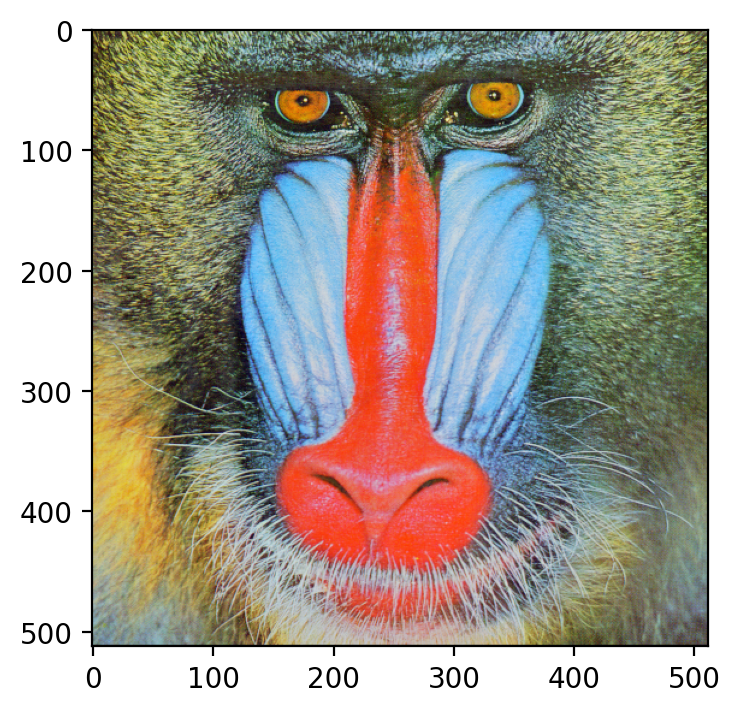

In [7]:
img_large = np.array(imageio.v3.imread('../data/mandrill-large.tiff')) # 512 x 512 x 3
plt.imshow(img_large)
img_large.shape

Note that the small image becomes our training data and the large image our test data.

In [8]:
ndim = img_small.shape[-1]
train_data = img_small.reshape(-1, ndim).astype(float)
test_data = img_large.reshape(-1, ndim).astype(float)

# Part 1. K-means

<span class="instruction">Now implement `kmeans.train_kmeans()` function.</span> 

The following code runs the K-means algorithm on the provided sample image. The code will run quite fast (less than only few seconds) if your implementation is efficient enough. Especially, when it comes to computing distances, naive for loops might make the code quite slow (in which case you will lose small points); some sort of vectorization will be needed to fully pass the Autograder test cases without timeout.

In [9]:
%%time

# K-means
num_centroid = 16
initial_centroid_indices = [
    16141, 15086, 15419,  3018,  5103,  6545, 15299, 11460,
    1006,  11603, 11095,  6257, 15220, 10027, 11411, 13403,
]
initial_centroids = train_data[initial_centroid_indices, :]
centroids = kmeans.train_kmeans(train_data, initial_centroids)

Iteration  0: mean error = 23.26
Iteration  0: mean error = 23.26
Iteration  1: mean error = 21.70
Iteration  1: mean error = 21.70
Iteration  2: mean error = 21.33
Iteration  2: mean error = 21.33
Iteration  3: mean error = 21.15
Iteration  3: mean error = 21.15
Iteration  4: mean error = 21.02
Iteration  4: mean error = 21.02
Iteration  5: mean error = 20.93
Iteration  5: mean error = 20.93
Iteration  6: mean error = 20.84
Iteration  6: mean error = 20.84
Iteration  7: mean error = 20.76
Iteration  7: mean error = 20.76
Iteration  8: mean error = 20.67
Iteration  8: mean error = 20.67
Iteration  9: mean error = 20.56
Iteration  9: mean error = 20.56
Iteration 10: mean error = 20.35
Iteration 10: mean error = 20.35
Iteration 11: mean error = 19.95
Iteration 11: mean error = 19.95
Iteration 12: mean error = 19.81
Iteration 12: mean error = 19.81
Iteration 13: mean error = 19.73
Iteration 13: mean error = 19.73
Iteration 14: mean error = 19.68
Iteration 14: mean error = 19.68
Iteration 

In [10]:
print(centroids)

[[179.72435233 170.3492228  165.17305699]
 [141.0414866  137.14001729  84.05358686]
 [172.89962825 105.05204461  42.01115242]
 [ 80.97386018  87.7118541   69.14711246]
 [220.79384203 103.16064257 100.38286479]
 [ 90.53689567 110.05258694 109.04495335]
 [203.72891566 168.82329317  75.2248996 ]
 [238.20445177  77.47238252  47.6801319 ]
 [118.34352159 132.94352159 118.11893688]
 [116.56712963 182.53125    227.14699074]
 [ 96.48863636 138.66818182 176.69318182]
 [161.34068844 161.31067961 115.17563989]
 [108.98795181 111.48058902  76.854083  ]
 [157.63301141 192.64793679 221.53643547]
 [ 58.07207207  56.59259259  44.83383383]
 [139.46262093 155.34212841 146.54617414]]


## Visualization

If you implemented K-means clusetering successfully, we can visualize the result of K-means clustering (the 16 centroids) on this dataset:

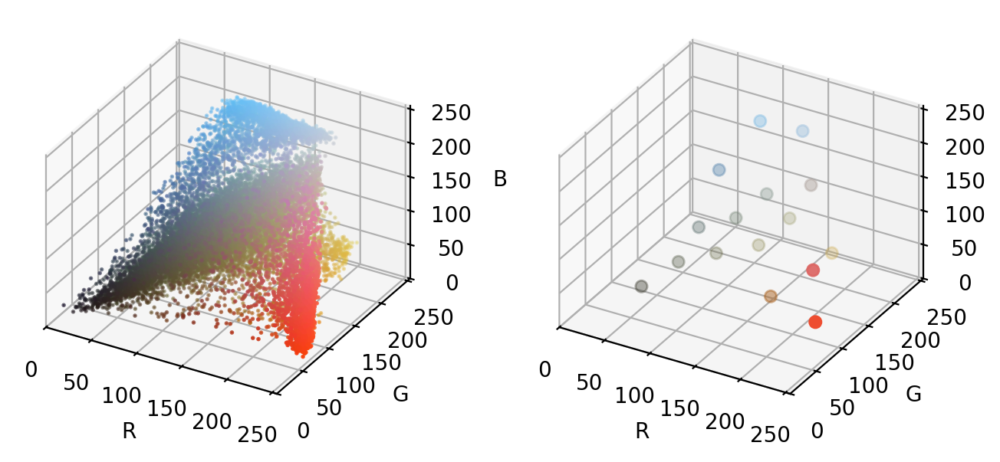

In [11]:
def visualize_3d(data, clusters):
    fig, axes = plt.subplots(1, 2, figsize=(7, 3), subplot_kw={'projection': '3d', 'proj_type': 'ortho'})

    # Data points
    axes[0].scatter(data[:, 0], data[:, 1], data[:, 2], c=data[:, :] / 255.0, s=1.0)
    axes[0].set(xlabel="R", ylabel="G", zlabel="B");
    axes[0].set(xlim=(0,255), ylim=(0,255), zlim=(0,255))
    
    # Cluster centroids
    axes[1].scatter(clusters[:, 0], clusters[:, 1], clusters[:, 2], c=clusters[:, :] / 255.0, s=30)
    axes[1].set(xlabel="R", ylabel="G", zlabel="B");
    axes[1].set(xlim=(0,255), ylim=(0,255), zlim=(0,255))

    fig.tight_layout()
    return fig, axes


def animate(fig, axes):
    from IPython.display import HTML
    import matplotlib.animation

    num_frames = 50
    def animate_fn(i):
        print(f'#{i}', end='\n' if (i + 1) % 10 == 0 else ' ', flush=True)
        axes[0].view_init(30, np.linspace(-179, 179, num_frames)[i])
        axes[1].view_init(30, np.linspace(-179, 179, num_frames)[i])

    anim = matplotlib.animation.FuncAnimation(fig, animate_fn, frames=num_frames, interval=200)
    return HTML(anim.to_html5_video())


fig, axes = visualize_3d(train_data, centroids)

Or as an animation: (Warning: this is pretty slow, so feel free to skip if it's time consuming)

In [ ]:
# This may require you to install ffmpeg
# This link may be helpful https://stackoverflow.com/questions/13316397/matplotlib-animation-no-moviewriters-available
animate(fig, axes)

#0 #0 #1 #2 #3 #4 #5 #6 #7 #8 #9
#10 #11 #12 #13 #14 #15 #16 #17 #18 #19
#20 #21 #22 #23 #24 #25 #26 #27 #28 #29
#30 #31 #32 #33 #34 #35 #36 #37 #38 #39
#40 #41 #42 #43 #44 #45 #46 #47 #48 #49


In [ ]:
import sys
sys.path.append('C:\\Users\\lvyiw\Downloads\\fmpeg-2025-03-13-git-958c46800e-full_build\\ffmpeg\\bin')
sys.path

## Test: Compression

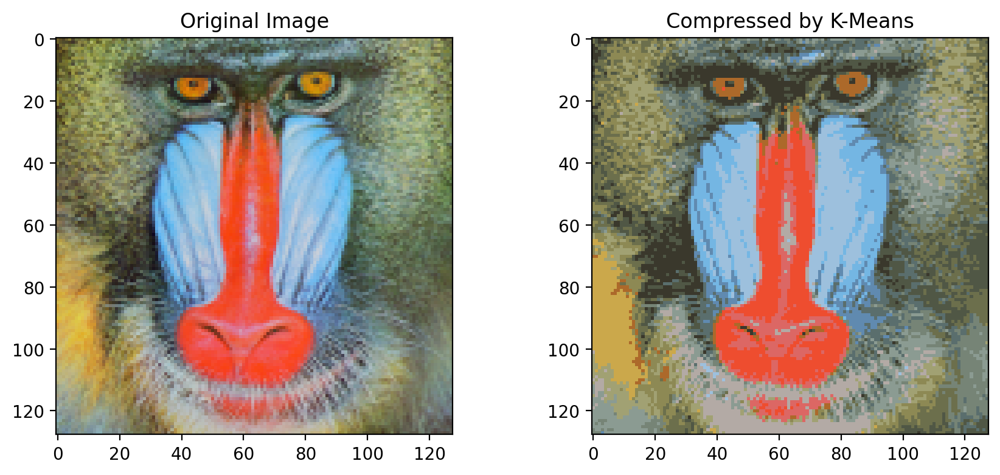

In [15]:
img_compressed = kmeans.compress_image(img_small, centroids)

fig, axes = plt.subplots(1, 2, figsize=(9, 4))
axes[0].imshow(img_small)
axes[0].set_title("Original Image")

axes[1].imshow(img_compressed)
axes[1].set_title("Compressed by K-Means")
fig.tight_layout()

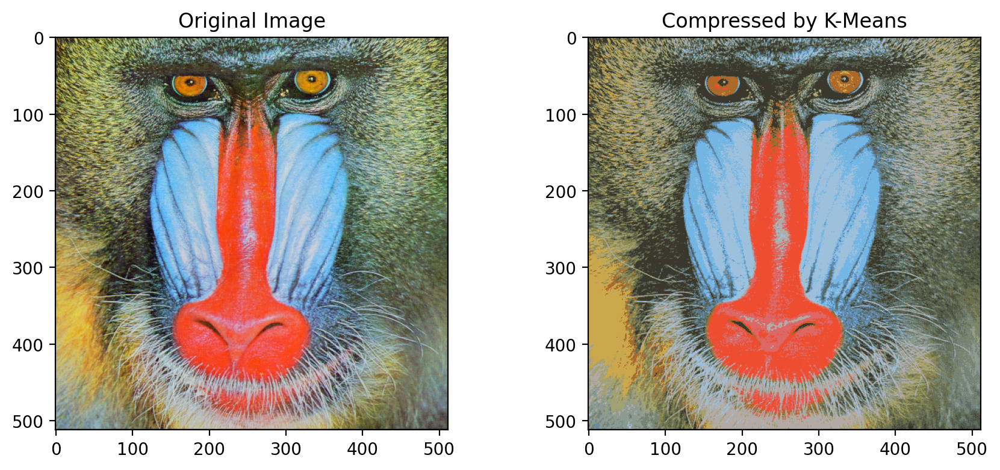

In [16]:
img_compressed = kmeans.compress_image(img_large, centroids)

fig, axes = plt.subplots(1, 2, figsize=(9, 4))
axes[0].imshow(img_large)
axes[0].set_title("Original Image")

axes[1].imshow(img_compressed)
axes[1].set_title("Compressed by K-Means")
fig.tight_layout()

<span class="instruction">Compute and measure the (mean) pixel error.</span> Report this value to the write-up.

In [17]:
# ~~START DELETE~~
kmeans.euclidean_distance(img_compressed, img_large).mean()
# ~~END DELETE~~

14.645763175136086

<br/><br/><br/><br/><br/><br/><br/><br/><br/>

# Part 2. GMM

现在让我们使用高斯混合模型（Gaussian Mixtures，带完整协方差矩阵）来重复前面的图像压缩任务，这次将聚类数设置为 $K = 5$，

In [ ]:
import numpy as np
from typing import NamedTuple, Union, Literal


class GMMState(NamedTuple):
    """Parameters to a GMM Model."""
    pi: np.ndarray  # [K]
    mu: np.ndarray  # [K, d]
    sigma: np.ndarray  # [K, d, d]


我们使用 `gmm.train_gmm()` 来训练一个 GMM 模型.

可以使用 `scipy.stats.multivariate_normal()` 来计算数据的对数似然（log-likelihood）。

在计算 $\gamma(z_{nk})$ 时可以使用 `scipy.special.logsumexp()`。由于 division by small probabilities 可能出现数值不稳定问题，实际中推荐使用对数似然来表示（可能很小的）概率 $N(x^{(n)} \mid \mu_k, \Sigma_k)$，即：
$$
N(x^{(n)} \mid \mu_k, \Sigma_k) = \exp[\log N(x^{(n)} \mid \mu_k, \Sigma_k)]  \notag
$$
**注意：** 不要使用（也不需要使用）`scipy` 或 `scikit-learn` 的其他 API。

------



**E-step** (compute responsibilities):

For each point $ x_n $, and cluster $ k $:
$$
\gamma(z_{nk}) = \frac{\pi_k \cdot \mathcal{N}(x_n \mid \mu_k, \Sigma_k)}{\sum_{j=1}^K \pi_j \cdot \mathcal{N}(x_n \mid \mu_j, \Sigma_j)} \notag
$$

Use **log-space trick**:

- compute `log p(x_n | k)` using `scipy.stats.multivariate_normal.logpdf`
- then compute log-sum-exp over $ k $for normalization (using `scipy.special.logsumexp`)
- exponentiate to get $ \gamma(z_{nk})$

**M-step** (update parameters):

Let $ N_k = \sum_n \gamma(z_{nk}) $

- $ \pi_k = \frac{N_k}{N} $
- $ \mu_k = \frac{1}{N_k} \sum_n \gamma(z_{nk}) x_n $
- $ \Sigma_k = \frac{1}{N_k} \sum_n \gamma(z_{nk}) (x_n - \mu_k)(x_n - \mu_k)^T $




### implementation of GMM training

In [ ]:
def train_gmm(train_data: np.ndarray,
            init_pi: np.ndarray,
            init_mu: np.ndarray,
            init_sigma: np.ndarray,
            *,
            num_iterations: int = 50,
            ) -> GMMState:
    """Fit a GMM model.

    Arguments:
        train_data: A numpy array of shape (N, d), where
            N is the number of data points
            d is the dimension of each data point. Note: you should NOT assume
                d is always 3; rather, try to implement a general K-means.
        init_pi: The initial value of pi. Shape (K, )
        init_mu: The initial value of mu. Shape (K, d)
        init_sigma: The initial value of sigma. Shape (K, d, d)
        num_iterations: Run EM (E-steps and M-steps) for this number of
            iterations.

    Returns:
        A GMM parameter after running `num_iterations` number of EM steps.
    """
    # Sanity check
    N, d = train_data.shape
    K, = init_pi.shape
    assert init_mu.shape == (K, d)
    assert init_sigma.shape == (K, d, d)

    pi, mu, sigma = init_pi.copy(), init_mu.copy(), init_sigma.copy()

    ###########################################################################
    # EM algorithm for learning GMM.
    ###########################################################################
    from scipy.stats import multivariate_normal
    from scipy.special import logsumexp
    from scipy.linalg import det, inv
    total_log_likelihood = []
    
    for it in range(num_iterations):
    # E-step
        log_prob = np.zeros((N, K))  # log p(x_n | k)
        for k in range(K):
            log_prob[:, k] = np.log(pi[k] + 1e-10) + multivariate_normal.logpdf(train_data, mean=mu[k], cov=sigma[k])
        
        log_sum = logsumexp(log_prob, axis=1, keepdims=True)  # shape (N, 1)
        log_gamma = log_prob - log_sum
        gamma = np.exp(log_gamma)  # shape (N, K)

        # M-step
        N_k = np.sum(gamma, axis=0)  # shape (K,)
        pi = N_k / N

        mu = (gamma.T @ train_data) / N_k[:, np.newaxis]  # shape (K, d)

        for k in range(K):
            diff = train_data - mu[k]  # shape (N, d)
            sigma_k = np.einsum('ni,nj->ij', diff * gamma[:, k:k+1], diff) / N_k[k]
            sigma[k] = sigma_k

        total_log_likelihood.append(np.sum(log_sum))
    # Plot the log-likelihood
    import matplotlib.pyplot as plt
    plt.plot(total_log_likelihood)
    plt.xlabel('Iteration')
    plt.ylabel('Log-likelihood')
    plt.title('Log-likelihood vs. Iteration')
    plt.show()
    
    #######################################################################

    return GMMState(pi, mu, sigma)

### train GMM with $K=5$

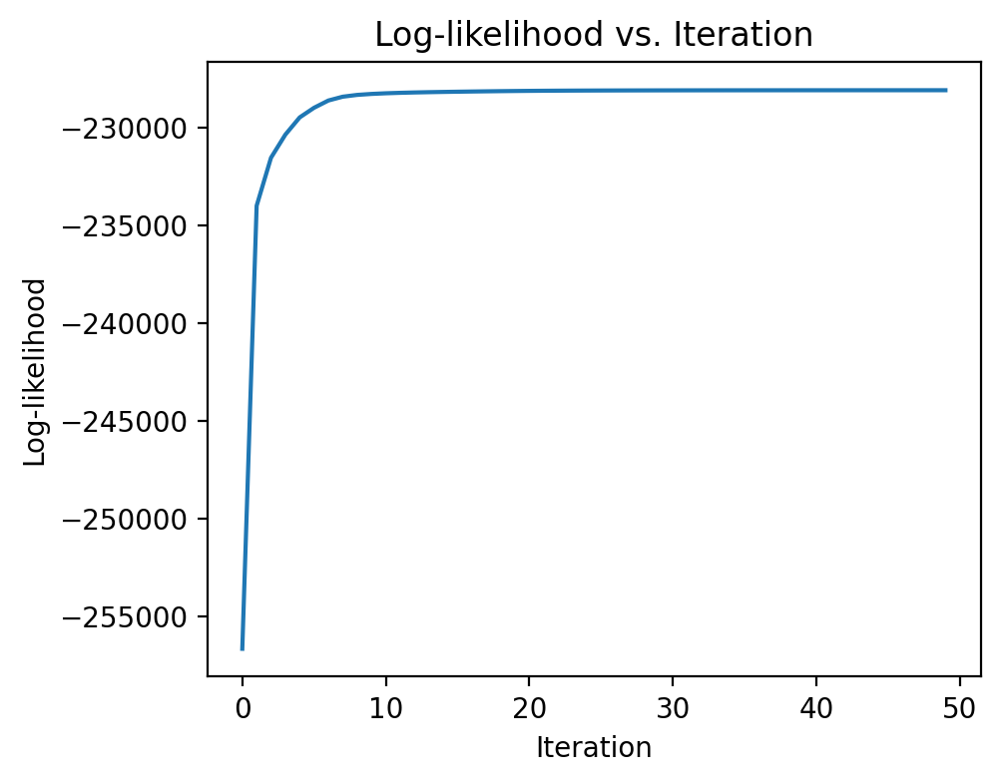

In [29]:
# Initialize pi, mu, sigmanum_centroid = 5
initial_mu_indices = [16041, 15086, 15419,  3010,  5845]
num_mixtures = 5

init_pi = np.ones((num_mixtures)) / num_mixtures
init_mu = train_data[initial_mu_indices, :]
init_sigma = np.tile(np.identity(ndim), [num_mixtures, 1, 1]) * 1000.

gmm_model = gmm.train_gmm(train_data, init_pi, init_mu, init_sigma)
pi, mu, sigma = gmm_model

assert pi.shape == (5, )
assert mu.shape == (5, 3)
assert sigma.shape == (5, 3, 3)

You can print out the model parameters:

In [ ]:
np.set_printoptions(precision=2)
print(f"{pi = }")
print(f"{mu = }")
print(f"{sigma = }")

pi = array([0.13, 0.43, 0.11, 0.21, 0.11])
mu = array([[180.22, 149.48, 116.78],
       [125.08, 136.46, 114.67],
       [233.67,  86.85,  67.54],
       [ 81.61,  89.01,  69.69],
       [140.02, 189.46, 225.51]])
sigma = array([[[ 521.36,  290.61, -210.66],
        [ 290.61, 1047.03,  842.88],
        [-210.66,  842.88, 2511.74]],

       [[ 742.09,  526.24,   40.68],
        [ 526.24,  607.66,  454.3 ],
        [  40.68,  454.3 , 1226.68]],

       [[ 129.72, -108.61, -238.98],
        [-108.61,  259.27,  460.1 ],
        [-238.98,  460.1 , 1035.17]],

       [[ 459.17,  518.45,  324.74],
        [ 518.45,  692.35,  486.85],
        [ 324.74,  486.85,  463.54]],

       [[ 612.96,  146.43,  -90.39],
        [ 146.43,   89.24,   32.62],
        [ -90.39,   32.62,   82.26]]])


### Visualizing trained model

We can reuse the visualization code. In addition, we can visualize the covariance matrix as well!

Try to see if the above parameters of a GMM agree with the plot below:

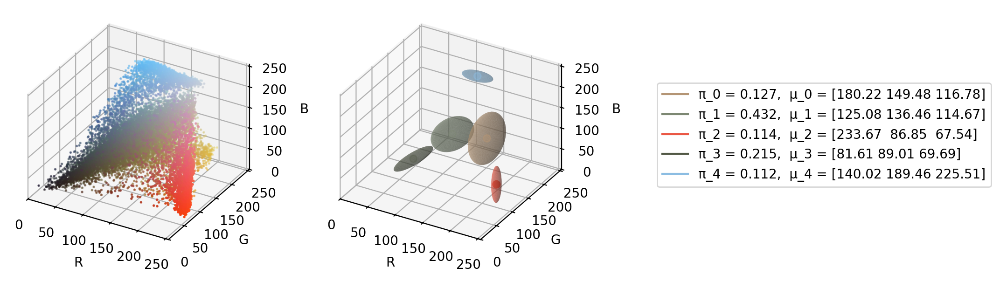

In [22]:
fig, axes = visualize_3d(train_data, mu)
fig.legend(
    [matplotlib.lines.Line2D([0], [0], color=mu_k/255.0) for mu_k in list(mu)],
    [f"π_{k} = {pi[k]:.3f},  μ_{k} = {mu[k]}" for k in range(mu.shape[0])],
    loc='center left', bbox_to_anchor=(1.05, 0.5)
)

for k in range(mu.shape[0]):
    covariance = sigma[k]
    
    # Use eigendecomposition to draw the 3D ellipsoid
    U, S, V = np.linalg.svd(covariance)
    u = np.linspace(0.0, 2.0 * np.pi, 50)
    v = np.linspace(0.0, np.pi, 50)
    # x, y, z on the principle axes with radius being sqrt{eigenvalue}
    x = (np.sqrt(S[0])) * np.outer(np.cos(u), np.sin(v))
    y = (np.sqrt(S[1])) * np.outer(np.sin(u), np.sin(v))
    z = (np.sqrt(S[2])) * np.outer(np.ones_like(u), np.cos(v))
    # Rotation
    xyz = np.stack([x, y, z], axis=2) @ U.T  # [50, 50, 3] * [3, 3]
    # Translation (centered at mu[k])
    xyz += mu[k, :][np.newaxis, np.newaxis, :]
    axes[1].plot_surface(xyz[:, :, 0], xyz[:, :, 1], xyz[:, :, 2], 
                         shade=True, alpha=0.5, color=mu[k] / 255.0)

In [ ]:
# Pretty slow again ... feel free to skip
animate(fig, axes)

### Applying trained GMM model to Image Compression


在使用 `mandrill-small.tiff` 训练后，读取测试图像 `mandrill-large.tiff`，并将每个像素的 $(r, g, b)$ 值替换为其 value of latent cluster mean ($\mu_k$). 这里对于每个 pixel, 我们使用 MAP（最大后验估计，Maximum A Posteriori）for the latent cluster-assignment variable.

<span class="instruction">Implement a function `gmm.compress_image()`</span> which takes a RGB image and a K-means clustering result as input, and returns a compressed image by replacing each pixel with the mean value of the closest cluster (or with the maximum probability). Please add additional cells to compute and report the mean pixel error between the original and compressed image.

In [ ]:
def compress_image(image: np.ndarray, gmm_model: GMMState) -> np.ndarray:
    """Compress image by mapping each pixel to the mean value of a
    Gaussian component (hard assignment).

    Arguments:
        image: A numpy array of shape (H, W, 3) and dtype uint8.
        gmm_model: type GMMState. A GMM model parameters.
    Returns:
        compressed_image: A numpy array of (H, W, 3) and dtype uint8.
            Be sure to round off to the nearest integer.
    """
    H, W, C = image.shape
    K = gmm_model.mu.shape[0]
    ###########################################################################
    # Implement image compression algorithm using the GMM model
    ##########################################################################
    
    from scipy.stats import multivariate_normal
    from scipy.special import logsumexp
    
    # Flatten the image into (N, 3)
    flat_image = image.reshape(-1, 3).astype(np.float32)

    # Compute log-probability under each Gaussian
    log_probs = np.zeros((flat_image.shape[0], K))  # shape (N, K)
    for k in range(K):
        log_probs[:, k] = multivariate_normal.logpdf(
            flat_image, mean=gmm_model.mu[k], cov=gmm_model.sigma[k]
        ) + np.log(gmm_model.pi[k] + 1e-10)

    # Assign each pixel to the most likely Gaussian (highest log-prob)
    labels = np.argmax(log_probs, axis=1)
    compressed_pixels = gmm_model.mu[labels]

    # Round and clip to valid uint8 range
    compressed_pixels = np.round(compressed_pixels).astype(np.uint8)
    compressed_image = compressed_pixels.reshape(H, W, C)

    
    ##########################################################################

    assert compressed_image.dtype == np.uint8
    assert compressed_image.shape == (H, W, C)
    return compressed_image


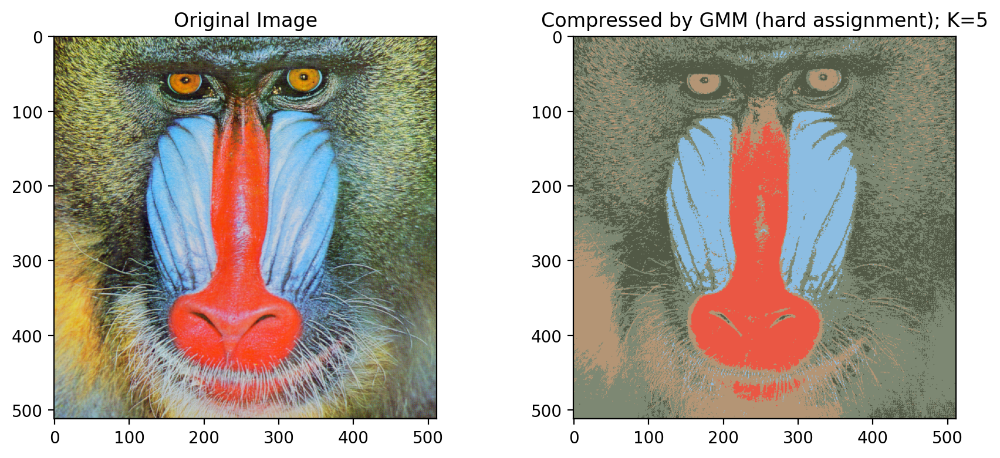

In [24]:
img_compressed = gmm.compress_image(img_large, gmm_model)

fig, axes = plt.subplots(1, 2, figsize=(9, 4))
axes[0].imshow(img_large)
axes[0].set_title("Original Image")

axes[1].imshow(img_compressed)
axes[1].set_title("Compressed by GMM (hard assignment); K=5")
fig.tight_layout()

In [25]:
# ~~START DELETE NO TODO~~
kmeans.euclidean_distance(img_compressed, img_large).mean()
# ~~END DELETE~~

16.365135581692456

### train GMM with $K=16$

Let's repeat this process again with K = 16. How would you compare the result from K-means with the same number of clusters?

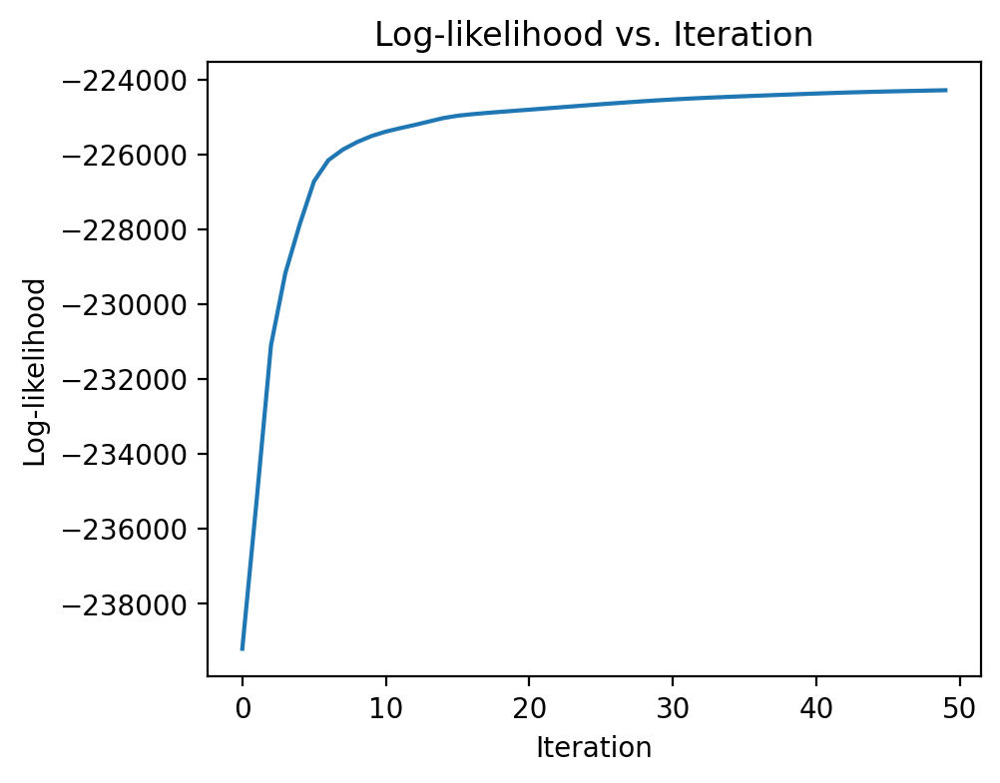

In [35]:
# Initialize pi, mu, sigma (K = 16)
initial_mu_indices = np.random.RandomState(545).choice(train_data.shape[0], size=16, replace=False)

init_pi = np.ones(len(initial_mu_indices)) / num_mixtures
init_mu = train_data[initial_mu_indices, :]
init_sigma = np.tile(np.identity(ndim), [len(initial_mu_indices), 1, 1]) * 1000.

gmm_model_16 = gmm.train_gmm(train_data, init_pi, init_mu, init_sigma)
pi_16, mu_16, sigma_16 = gmm_model_16

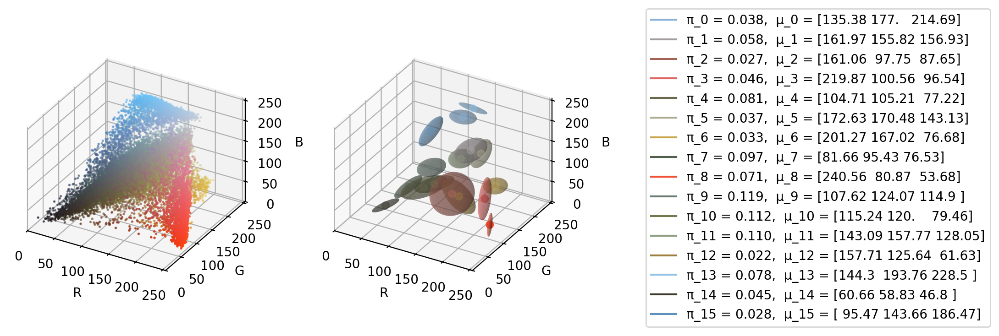

In [38]:
fig, axes = visualize_3d(train_data, mu_16)
fig.legend(
    [matplotlib.lines.Line2D([0], [0], color=mu_k/255.0) for mu_k in list(mu_16)],
    [f"π_{k} = {pi_16[k]:.3f},  μ_{k} = {mu_16[k]}" for k in range(mu_16.shape[0])],
    loc='center left', bbox_to_anchor=(1.05, 0.5)
)

for k in range(mu_16.shape[0]):
    covariance = sigma_16[k]
    
    # Use eigendecomposition to draw the 3D ellipsoid
    U, S, V = np.linalg.svd(covariance)
    u = np.linspace(0.0, 2.0 * np.pi, 50)
    v = np.linspace(0.0, np.pi, 50)
    # x, y, z on the principle axes with radius being sqrt{eigenvalue}
    x = (np.sqrt(S[0])) * np.outer(np.cos(u), np.sin(v))
    y = (np.sqrt(S[1])) * np.outer(np.sin(u), np.sin(v))
    z = (np.sqrt(S[2])) * np.outer(np.ones_like(u), np.cos(v))
    # Rotation
    xyz = np.stack([x, y, z], axis=2) @ U.T  # [50, 50, 3] * [3, 3]
    # Translation (centered at mu[k])
    xyz += mu_16[k, :][np.newaxis, np.newaxis, :]
    axes[1].plot_surface(xyz[:, :, 0], xyz[:, :, 1], xyz[:, :, 2], 
                        shade=True, alpha=0.5, color=mu_16[k] / 255.0)

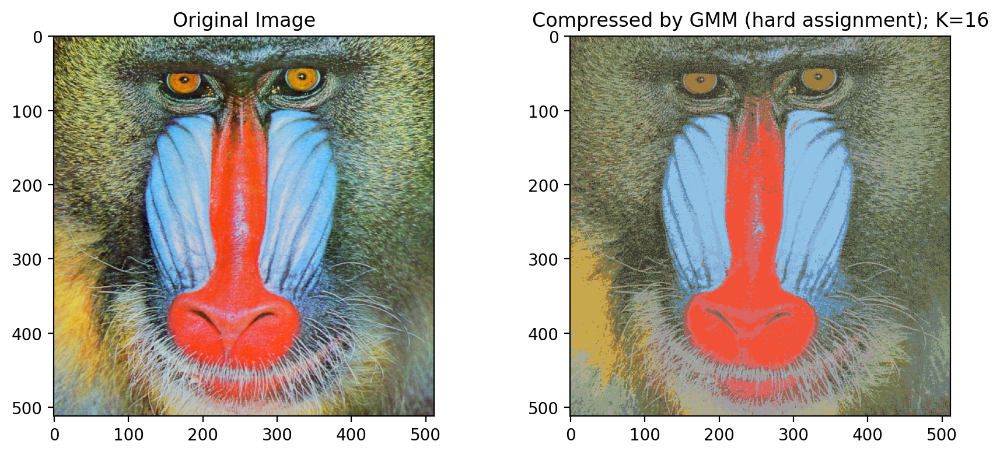

In [27]:
img_compressed_16 = gmm.compress_image(img_large, gmm_model_16)

fig, axes = plt.subplots(1, 2, figsize=(9, 4))
axes[0].imshow(img_large)
axes[0].set_title("Original Image")

axes[1].imshow(img_compressed_16)
axes[1].set_title("Compressed by GMM (hard assignment); K=16")
fig.tight_layout()